# TWITTER ANALYSIS WITH SPACY
### USING SPACY POS_ ANALYSIS AND WORDCLOUDS TO ANALYZE TWEETS

# Step 0:
### Importing libraries and data:

In [1]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import re
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import tweets from NLP analysis:

tweets_analysis = pd.read_csv('tweets_analysis.csv')
tweets_analysis.head()
tweets_analysis.drop('Unnamed: 0', axis=1, inplace=True)

##### Import large dataframe with tweets (that have not yet been processed for NLP:

In [3]:
tweets = pd.read_csv('tweets_to_preprocess_NLP.csv')

In [4]:
tweets.head()
tweets.drop(['Unnamed: 0', 'Handle', 'ID', 'CreatedAt', 'Geocode', 'Follower', 'Location', 'UserDescription', 'Location_code', 'Friend'], axis=1, inplace=True)

In [5]:
tweets.shape

(8425, 2)

In [6]:
tweets['Country'].value_counts()

Germany    6002
USA        2423
Name: Country, dtype: int64

# Step 1:
### Clean/Process the data:

In [7]:
tweets_USA = tweets[tweets['Country']=='USA']
tweets_DE = tweets[tweets['Country']=='Germany']

In [8]:
# remove RT and punction, make all words lowercase, tokenize:

# Use function from notebook "Sentiment-Analysis-on-Twitter-Network.ipynb"
def clean_up(x):
    """ Clean up the text before NLP. 
    Remove Punctuation, remove retweet and @.
    Keep German characters as vowels."""
    
    remove_rt = lambda x: re.sub('RT @\w+: ', "", x)
    lab = lambda x: re.sub('[^äöüÄÖÜA-Za-z ]+','', x)
    tw_1 = remove_rt(x)
    tw_2 = lab(tw_1)
    tw_3 =  tw_2.lower()
    
    return tw_3
    

In [9]:
tweets_USA['text'] = tweets_USA['TweetText'].apply(clean_up)

In [10]:
tweets_DE['text'] = tweets_DE['TweetText'].apply(clean_up)

### Define the Stopwords (German and English) to exclude from WordClouds

In [11]:
stopwords = set(STOPWORDS)
lst_stopwords = list(stopwords)

In [12]:
from nltk.corpus import stopwords
stopset = stopwords.words('german')
# stopset

In [13]:
stopwords_de_en = []
stopwords_de_en.extend(lst_stopwords)
stopwords_de_en.extend(stopset)
# stopwords_de_en

In [14]:
# Can I somehow manually exclude words ['amp', 'mehr', 'u'] that were central in both clouds. 
exclude = ['amp', 'mehr', 'u']
stopwords_de_en.extend(exclude)

In [15]:
stopwords_de_en = stopwords_de_en[1:]
# stopwords_de_en

# Step 2:
### Make WordClouds for my American/German Network's Tweets:

In [16]:
# WordCloud of Tweets from my American Twitter Network:

comment_words = ''
stopwords = stopwords_de_en

# iterate through USA dataframe:
for val in tweets_USA['text']:
    
    
    if val not in stopwords_de_en:
        # make each value a string
        val = str(val)
    
        # split words
        tokens = val.split()
    
        comment_words += " ".join(tokens)+" "

wordcloud_USA = WordCloud(width=800, height=800,
                         background_color ='white',
                         stopwords=stopwords,
                         min_font_size=10).generate(comment_words)

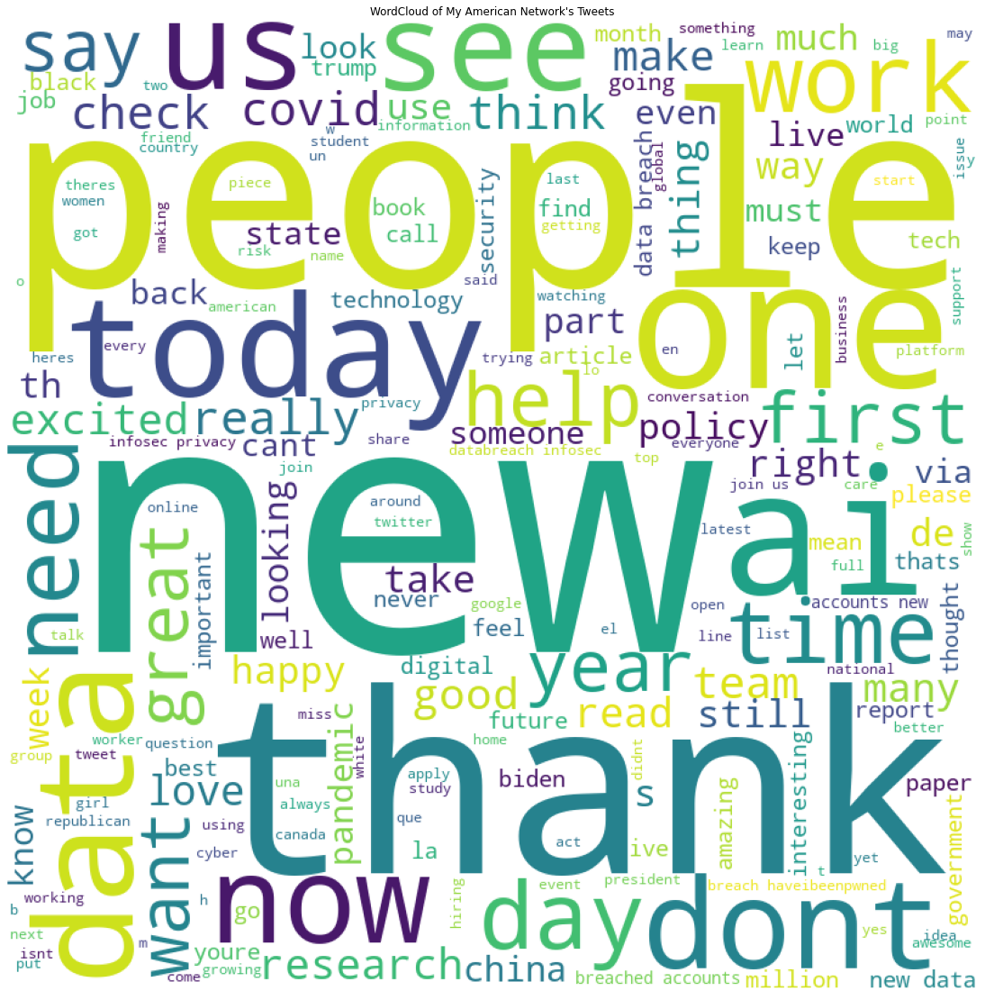

In [49]:
# Plot USA wordcloud:

plt.figure(figsize=(15,15), facecolor=None)
plt.imshow(wordcloud_USA)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title("WordCloud of My American Network's Tweets")
plt.savefig('My_American_Twitter_WordCloud_vers3.png')
plt.show()

In [ ]:
# Because the Germany tweets are both in German and English, plot words that are in NEITHER the german stopwords list NOR the english stopwords list!

In [174]:
# stopwords_de_en

In [18]:
# WordCloud of Tweets from my German Twitter Network:

comment_words = ''
stopwords = stopwords_de_en

# iterate through German dataframe:
for val in tweets_DE['text']:
    
    
    if val not in stopwords_de_en:
        
        # make each value a string
        val = str(val)
    
        # split words
        tokens = val.split()
    
        comment_words += " ".join(tokens)+" "

wordcloud_DE = WordCloud(width=800, height=800,
                         background_color ='white',
                         stopwords=stopwords,
                         min_font_size=10).generate(comment_words)

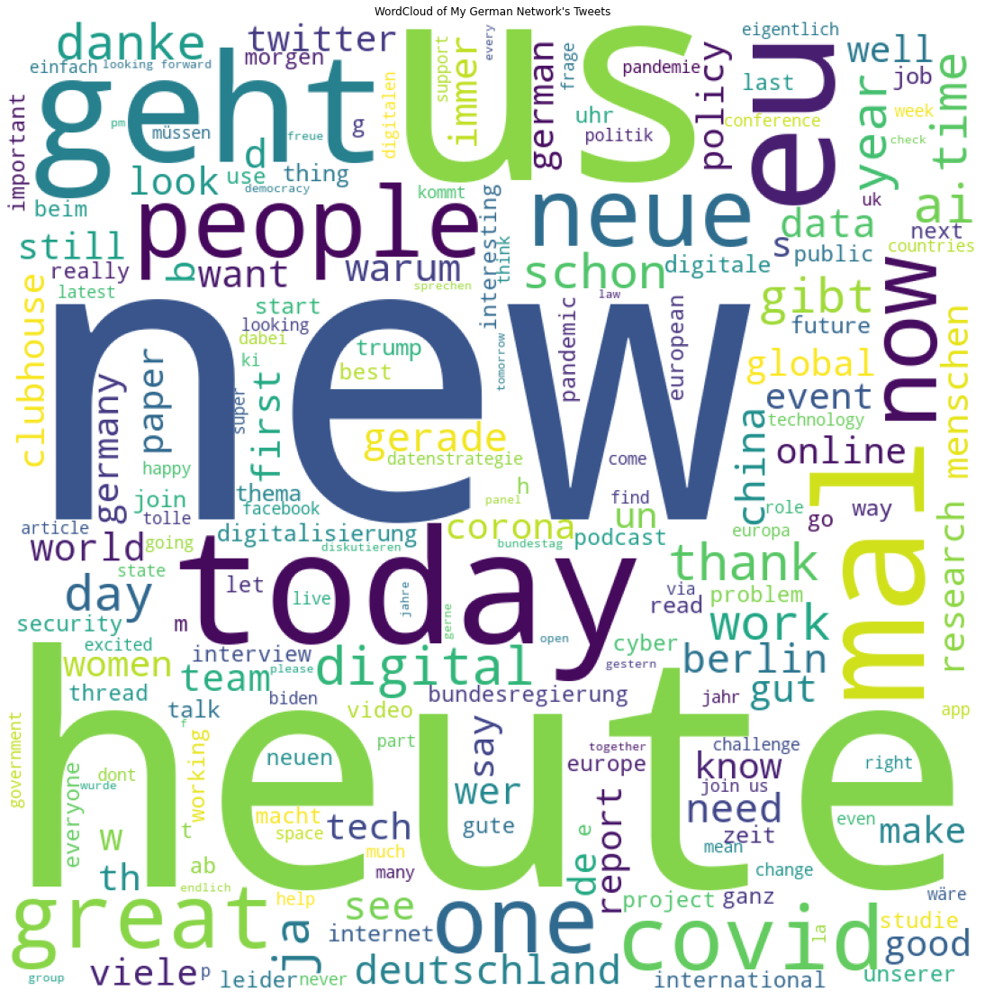

In [48]:
# Plot German wordcloud:

plt.figure(figsize=(15,15), facecolor=None)
plt.imshow(wordcloud_DE)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title("WordCloud of My German Network's Tweets")
plt.savefig('My_German_Twitter_WordCloud_vers3.png')
plt.show()

# Step 3:
### SpaCy POS analysis:

Would be interesting to see which are the most common adjectives used by the 2 demographics...
* Use package SpaCy
* step 1: Part-of-speech (POS) Tagging
* step 2: Named Entity Recognition (NER) (labelling named "real-world" objects, like persons, companies or locations.
* link: https://spacy.io/usage/spacy-101
* link: https://spacy.io/usage/linguistic-features#pos-tagging

##### Consider doing analysis to compare the most common adjectives (SpaCy).
* my hypothesis is that the German network will use more negative adjectives.
* any other underlying theories? 

Helpful links:
* https://medium.com/illumination/scraping-news-and-creating-a-word-cloud-in-python-10ea312c49ba
* https://www.geeksforgeeks.org/generating-word-cloud-python/

In [20]:
import spacy

In [ ]:
# !python3 -m spacy download en_core_web_sm

In [21]:
nlp = spacy.load("en_core_web_sm")

In [22]:
# Tokenization
# spaCy tokenizes the text and creates a document object
tweets_USA['doc'] = [nlp(text) for text in tweets_USA['text']]

In [23]:
tweets_USA.head()
# NOTE that the index got messed up. 
# Need to reset_index for both USA and DE dataframes 

,TweetText,Country,text,doc
21,"@donie Does he feel, like he's a rider, on a D...",USA,donie does he feel like hes a rider on a dowww...,"(donie, does, he, feel, like, he, s, a, rider,..."
22,"Me a year ago: ""Yeahhh, I'll still shave every...",USA,me a year ago yeahhh ill still shave every day...,"(me, a, year, ago, yeahhh, ill, still, shave, ..."
23,#MachineLearning #DataScience https://t.co/VF0...,USA,machinelearning datascience httpstcovfvkdpmoh,"(machinelearning, datascience, httpstcovfvkdpmoh)"
24,RT @WalterReade: Here's an awesome @kaggle not...,USA,heres an awesome kaggle notebook showing how t...,"(heres, an, awesome, kaggle, notebook, showing..."
25,Kaggle has a new #MachineLearning competition ...,USA,kaggle has a new machinelearning competition t...,"(kaggle, has, a, new, machinelearning, competi..."


In [24]:
tokens = [token for token in tweets_USA['doc']]

In [25]:
# Print sample of part-of-speech tags:

In [26]:
tweets_USA['text'][21]

'donie does he feel like hes a rider on a dowwwnnbound train'

In [27]:
# Define a sample to make sure it works. 
sample = tweets_USA['text'][21]

In [28]:
document = nlp(sample)

In [29]:
for token in document:
    if token.pos_ == 'NOUN':
        print(token, token.pos_)

# dowwwnnbound would be ADJ, not NOUN. Otherwise good

donie NOUN
rider NOUN
dowwwnnbound NOUN
train NOUN


In [30]:
document_all_tweets = tweets_USA['text'].apply(nlp)

In [31]:
adjectives_USA = []

for doc in document_all_tweets:
    for token in doc:
        if token.pos_ == 'ADJ':
            adjectives_USA.append(token)

In [32]:
adjectives_USA

[ill,
 awesome,
 tabular,
 new,
 smart,
 true,
 many,
 great,
 virtual,
 good,
 easier,
 happy,
 simple,
 lightweight,
 perfect,
 newest,
 easier,
 ai,
 big,
 artificial,
 neural,
 best,
 separate,
 related,
 artificial,
 crazy,
 top,
 nowhttpstcoehpmzkgglobaliqx,
 denisegarth,
 xbond,
 potential,
 testimonial,
 financial,
 ultimate,
 advisory,
 local,
 near,
 financial,
 advisory,
 financial,
 higher,
 httpstcoujehborubk,
 advisortech,
 many,
 more,
 financial,
 last,
 initial,
 current,
 new,
 roundtable,
 successful,
 financial,
 httpstcoxecjdwelgu,
 great,
 relevant,
 zedian,
 singular,
 und,
 zedian,
 underrated,
 german,
 federal,
 bundestag,
 insightful,
 german,
 farright,
 interesting,
 amazing,
 relevant,
 tombolamusikant,
 nabertronic,
 seine,
 frau,
 biden,
 anncathrin,
 frau,
 natürlich,
 nice,
 jasonhealey,
 good,
 great,
 best,
 zedian,
 effective,
 ihre,
 pua,
 irenemihalic,
 real,
 first,
 german,
 nyc,
 next,
 joergrupp,
 seebruecke,
 full,
 lame,
 german,
 new,
 sens

In [33]:
# How to analyze the adjectives? Word cloud?

comment_words = ''
stopwords = set(STOPWORDS)

for adj in adjectives_USA:
    adj = str(adj)
    
    tokens = adj.split()
    
    comment_words += " ".join(tokens)+" "
    
wordcloud1 = WordCloud(width=1000, height=800, 
                      background_color='white',
                      stopwords=stopwords,
                      min_font_size=10).generate(comment_words)

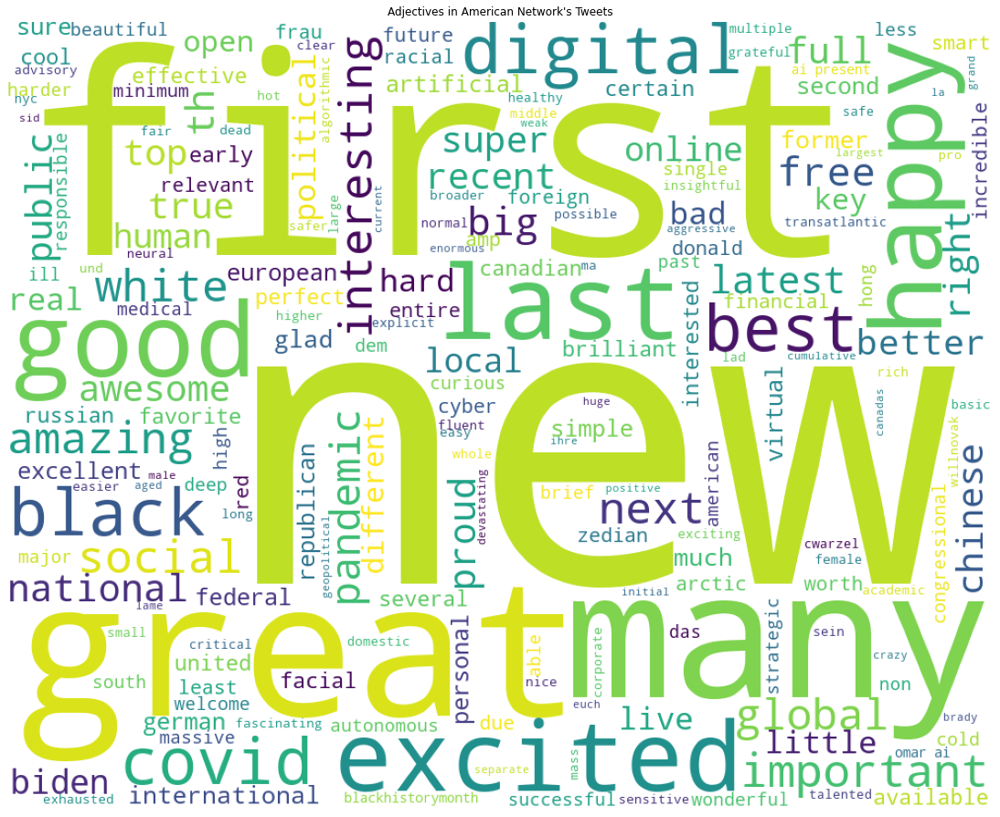

In [47]:
plt.figure(figsize=(15,15))
plt.imshow(wordcloud1)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title("Adjectives in American Network's Tweets")
plt.savefig('adjectives_usa_version3.png')
plt.show()

### Complete adjective analysis but change spacy model to german:

In [306]:
# !python3 -m spacy download de_core_news_sm

In [35]:
nlp = spacy.load("de_core_news_sm")

In [36]:
# Tokenization
# spaCy tokenizes the text and creates a document object
tweets_DE['doc'] = [nlp(text) for text in tweets_DE['text']]
tweets_DE.head()

,TweetText,Country,text,doc
0,RT @z_edian: Unser @snv_berlin Expert:innenwor...,Germany,unser snvberlin expertinnenworkshop zur staatl...,"(unser, snvberlin, expertinnenworkshop, zur, s..."
1,RT @rachel_groves: Daily goals: Wake up early....,Germany,daily goals wake up early drink coffee work ha...,"(daily, goals, wake, up, early, drink, coffee,..."
2,RT @michael_adler_: Fing gut an! Bonn braucht ...,Germany,fing gut an bonn braucht einen mindshift von d...,"(fing, gut, an, bonn, braucht, einen, mindshif..."
3,RT @EurAsiaBridgeEU: good topic - well done.,Germany,good topic well done,"(good, topic, , well, done)"
4,"Gestern haben @Lichtemomente, @askans, @michae...",Germany,gestern haben lichtemomente askans michaeladle...,"(gestern, haben, lichtemomente, askans, michae..."


In [37]:
tokens = [token for token in tweets_DE['doc']]

In [38]:
# Define a sample to make sure it works. 
sample = tweets_DE['text'][0]

In [39]:
document = nlp(sample)

In [40]:
for token in document:
    if token.pos_ == 'ADJ':
        print(token, token.pos_)

staatlichen ADJ
böswilligen ADJ


In [41]:
document_all_tweets = tweets_DE['text'].apply(nlp)

In [42]:
adjectives_DE = []

for doc in document_all_tweets:
    for token in doc:
        if token.pos_ == 'ADJ':
            adjectives_DE.append(token)

In [43]:
adjectives_DE

[staatlichen,
 böswilligen,
 mindshift,
 done,
 askans,
 ersten,
 beweggründe,
 persönliche,
 means,
 architekten,
 urban,
 städte,
 linke,
 seite,
 laden,
 zweiten,
 httpstcorjhfciv,
 name,
 languages,
 have,
 quote,
 bonner,
 neue,
 erste,
 heutigen,
 klassischen,
 besitzver,
 gute,
 gründe,
 kältehilfe,
 warmen,
 often,
 votes,
 wasnt,
 enough,
 httpstcojlpqlfuird,
 women,
 stolen,
 httpstcoydbmaryo,
 gaufmans,
 lisasresearch,
 accurate,
 were,
 protests,
 when,
 starts,
 breite,
 abbilden,
 draufwerfe,
 testen,
 alten,
 erhöhten,
 kitas,
 twitter,
 httpstcohzzrmrf,
 normalen,
 fragerunde,
 aussprache,
 vergangenen,
 httpstcowgvnftb,
 parteichef,
 parteitagen,
 wortmeldungenaussprache,
 fragerunde,
 reporting,
 time,
 loudtoo,
 aktuellen,
 thema,
 ausgezeichnete,
 wissenschaftjournalistin,
 rolle,
 europäische,
 europäischer,
 neue,
 europäische,
 launched,
 kaansahinde,
 httpstconuhjfqlo,
 hub,
 together,
 studies,
 pushes,
 cybersecuritygover,
 time,
 recherche,
 ges,
 states,
 ge

In [44]:
# Generate wordcloud of adjectives from German Network's tweets:

comment_words = ''
stopwords = stopwords_de_en

for adj in adjectives_DE:
    adj = str(adj)
    
    tokens = adj.split()
    
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width=1000, height=800, 
                      background_color='white',
                      stopwords=stopwords,
                      min_font_size=10).generate(comment_words)

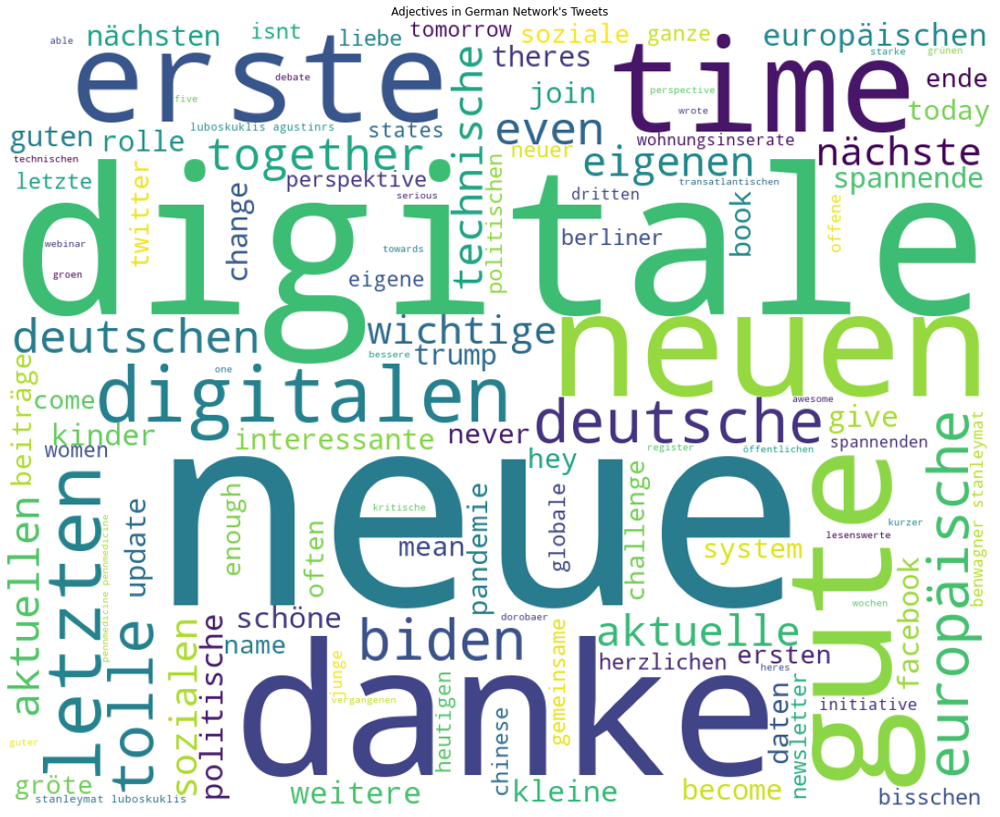

In [46]:
plt.figure(figsize=(15,15))
plt.imshow(wordcloud2)
plt.axis('off')
plt.tight_layout(pad=0)
plt.title("Adjectives in German Network's Tweets")
plt.savefig('adjectives_de_version3.png')
plt.show()

# Step 4:
### NER (Named Entity Recognition) Analysis with spaCy:

https://towardsdatascience.com/exploring-the-trump-twitter-archive-with-spacy-fe557810717c

https://gitlab.com/praj88/twitter-analytics/blob/master/scripts/twitter-analytics.ipynb

https://neptune.ai/blog/exploratory-data-analysis-natural-language-processing-tools

In [49]:
nlp = spacy.load("en_core_web_sm", disable=['tagger', 'parser', 'textcat'])

In [50]:
tweets_USA.head()

,TweetText,Country,text,doc
21,"@donie Does he feel, like he's a rider, on a D...",USA,donie does he feel like hes a rider on a dowww...,"(donie, does, he, feel, like, he, s, a, rider,..."
22,"Me a year ago: ""Yeahhh, I'll still shave every...",USA,me a year ago yeahhh ill still shave every day...,"(me, a, year, ago, yeahhh, ill, still, shave, ..."
23,#MachineLearning #DataScience https://t.co/VF0...,USA,machinelearning datascience httpstcovfvkdpmoh,"(machinelearning, datascience, httpstcovfvkdpmoh)"
24,RT @WalterReade: Here's an awesome @kaggle not...,USA,heres an awesome kaggle notebook showing how t...,"(heres, an, awesome, kaggle, notebook, showing..."
25,Kaggle has a new #MachineLearning competition ...,USA,kaggle has a new machinelearning competition t...,"(kaggle, has, a, new, machinelearning, competi..."


In [102]:
entities_US = []

def show_ents(doc):
    """Function that shows all entities (using NER spaCy analysis) in the US tweets."""
    
    for ent in doc.ents:
            print(ent.text+' - '+str(ent.start_char) +' - '+str(ent.end_char) +' - '+ent.label_+ ' - '+str(spacy.explain(ent.label_)))
            entities_US.append([ent, ent.label_])
    else:
        print("No named entities found.")
        

In [69]:
# Define a sample to make sure it works. 
sample = "Twitter makes it easy to analyze whether I should live in the US or UK."
document = nlp(sample)

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Twitter'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'makes'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'easy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger

In [103]:
show_ents(document)
# Twitter should probably also show up. 

US - 62 - 64 - GPE - Countries, cities, states
UK - 68 - 70 - GPE - Countries, cities, states
No named entities found.


In [104]:
document_all_tweets = tweets_USA['TweetText'].apply(nlp)

[W108] The rule-based lemmatizer did not find POS annotation for the token '@donie'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Does'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'he'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'feel'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'DataScience'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/VF0vkdpMOH'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@WalterReade'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign

[W108] The rule-based lemmatizer did not find POS annotation for the token 'shopping'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mall'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/9r2dcZ8CVx'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@TamaraMcCleary'. Check that your pipeline includes components that assi

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'AI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Conference'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'as'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'they'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'age'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '+'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '7'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribu

[W108] The rule-based lemmatizer did not find POS annotation for the token 'parsing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'HTML'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Simple'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/m76w5zxJbc'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Tune'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Check'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Altair'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'which'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ssollmn'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Even'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '''. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'data'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'DataScience'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@tunguz'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Minh_Q_Tran'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Top'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'use'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'testimonial'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/VtE3GyDIb9'. Check that your pipeline includes components that assign token.po

[W108] The rule-based lemmatizer did not find POS annotation for the token 'but'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'can'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'create'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'What'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ultimate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'services'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'value'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'remotely'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'near'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ')'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'future'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'over'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'financial'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'services'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'industry'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'tasks'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/TzmEW8d3l8'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/UJeHBOrUbK'. Check that your pipeline includes components that as

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'FinanacialPlanning'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'conversation'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'making'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'more'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'phone'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'calls'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'closing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'initial'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'secret'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'becoming'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Cyber'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ')'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Gefährder'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '2015'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Bundestag'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'work'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'by'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DFRLab'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '👏'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'das'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sind'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Pence'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'amp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'JD'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Work'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@HostileSpectrum'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Die'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'USA'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'und'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Europa'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'müssen'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token '@thehertieschool'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'focus'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Data'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/Kw3Iqd7plP'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@JoergRupp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@IreneMihalic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@_Seebruecke'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '_'. Check that your pipeline includes components t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'got'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'new'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'blog'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'soldiers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'liberated'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Auschwitz'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Birkenau'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'spell'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'whole'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'InaugurationDay'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'could'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'not'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/oJJalaTznf'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ConStelz'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/jHS17nSEcV'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'What'. Check that your pipeline includes components 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'inspirational'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'music'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'make'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'How'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'EU'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'updates'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'months'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'They'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''re'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'responsible'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'all'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'IT'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'been'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'colourised'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@michellebkwok'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token '🏈'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🎵'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Believe'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'or'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'superstar'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cities'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'but'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@mal_zworth'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'year'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'life'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'changing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'CES'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'yesterday'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@panasonic'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'List'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Join'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'us'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token '@michellebkwok'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ravinacanand'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@abenaanim21'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Love'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'each'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'exhibit'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'l'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/h6XLVIryiO'. Check that your pipeline includes components that assign token.pos, t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'talents'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'poten'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'public'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'service'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'agenda'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'look'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'like'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'de'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Draghi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'donde'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pongo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '👇'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🏽'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'A'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'partir'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribu

[W108] The rule-based lemmatizer did not find POS annotation for the token 'entonces'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@MaldonadoAg'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Gracias'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'y'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'que'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tampoco'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pueda'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '@RaquelJorgeR'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Critical'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'raw'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'materials'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'La'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mayoría'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'de'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Estados'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Quien'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'fiche'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'esta'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'joya'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '🚨'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '“'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'La'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'política'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tecnológica'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'diplomacia'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tecnológica'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'para'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'España'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token '🙋'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🏽‍'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '♀'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '️'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@WeAreXpats'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Gentlemen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '....'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Happy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'February'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'pandemic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Thanks'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@jeffreykluger'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'SEKO'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'students'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Could'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'OTD'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '1990'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '–'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Air'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pollution'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'name'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'would'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Georg'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/l75Vv4HCLM'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'working'. Check that your pipeline includes components that assign token.pos, 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hania'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '–'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '“'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Man'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Country'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Asylum'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Seekers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'COVID'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'misinfo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'dose'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'than'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tested'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'positive'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Time'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'series'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'analyses'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'revealed'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token 'misunderstand'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bridge'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'divides'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'partial'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ECONdailycharts'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Cumulative'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'CCES'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Policy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Preferences'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '''. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'thousands'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Russians'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'decrease'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'donations--'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'devastating'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'important'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/WC6QtYE5Zr'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@vcharnysh'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'So'. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token 'hilly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@pcastano'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Acá'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'en'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Phillips'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'curve'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/GaB6di49eZ'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@daniel_ftls'. Check that your pipeline includes components that assign

[W108] The rule-based lemmatizer did not find POS annotation for the token 'acá'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'se'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mantienen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'relativamente'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'estables'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Un'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'amigo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'francés'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'intento'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'non'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pens'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/dPXkviqr2D'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Miss__Hyde'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Cerró'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Tegel'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'un'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token '@dynarski'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'did'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'same'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/IHIkRosamz'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@juliana_londono'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '¿'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Ese'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'no'. Check that your pipeline includes components that assign tok

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'weapons'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'operated'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'operated'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'remotely'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'b'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'see'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'several'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'new'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'studies'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'psychology'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'behind'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'these'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dis'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '/'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@adicerimagic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Left'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'regrette'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'rien'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/3p1OvyQdry'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'When'. Check that your pipeline includes components that assign token.po

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/QAhnoPtY0J'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Canada'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'needs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'broader'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token 'advocat'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/FeqyAq9t0I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@StephanieCarvin'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign

[W108] The rule-based lemmatizer did not find POS annotation for the token 'CCWUN'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'meetings'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'removed'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'th'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@KelGallagh'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ipfconline1'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Omar'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hatamleh'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Decoded'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'here'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Here'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'peopl'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Twitter'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'could'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'directly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'issues'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'policy'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Indeed'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'all'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'us'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ipfconline1'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Omar'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hatamleh'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'will'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'land'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'April'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '21'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'unparalleled'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Mariana'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Mazzucato'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'or'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'rethinking'. Check that your pipeline includes components that assign token.po

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Measurementality'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'AI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Atlantic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'by'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'POLITICO'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/kre13ImYLu'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token 'paper'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'offers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'include'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'undermining'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'oppressive'. Check that your pipeline includes components that assign token.pos

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Zum'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'heutigen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'SID2021'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'betont'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Beispiel'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'aus'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Ital'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/I6o7YjCM0n'. Check that your pipeline includes components that assign token.pos

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@BundesKultur'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Das'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Rettungs-'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'kehren'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Ital'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@sbj_berlin'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Politsnack_KAS'. Check that your pipeline includes components that assign token.pos, 

[W108] The rule-based lemmatizer did not find POS annotation for the token '@clubhouse_de'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Ich'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bin'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'gespannt'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mehr'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Star'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '”'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cdupt21'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/MDmdPEyAdx'. Check that your pipeline includes components that assign token.pos, t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'es'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Podcasts'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'gibt'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Heute'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'hat'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dein'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Bericht'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'geste'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Facebook'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Live'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mit'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ARD'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'am'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'no'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'longer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'impressed'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'deprogram'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'under'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bedroom'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'door'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'election'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'job'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'interview'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'mama'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DickKingSmith'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token '@shannonrwatts'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'A'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tale'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'friends'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'going'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'betray'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Unless'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Related'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'To'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'non'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'political'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'staff'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bran'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@SlaughterAM'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Donald'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Trump'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'everyone'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'took'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'far'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'too'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'long'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'remains'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'central'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'security'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'spotted'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'something'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'eat'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'even'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token '⁦@GAC_Corporate⁩'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '⁦'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/qm17VJXxPz'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'supersonic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'interceptor'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'aircraft'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@CanadianForces'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'members'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token 'high'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'as'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sun'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'will'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'easily'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'destabilize'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'manipulate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'StrongerTogether'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'NATO2030'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'friend'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'colleague'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Michael'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token ')'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Engineers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'keep'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'news'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sustainable'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'even'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'On'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'January'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '18'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'we'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Homeoffice'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'erledigen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'könnten'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'science'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'flows'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'well'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'middle'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'aged'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'men'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Unbelievable'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@KnightCenterUT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Register'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Know'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'enemy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'put'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pressure'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'me'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '19th'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'International'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Anti'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'tech'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'founder'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'looking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'grow'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@WomenAtWebEA'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'project'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'all'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'kept'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pace'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sophistica'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Kate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Neville'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'one'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'sounds'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'death'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'knell'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'era'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token '''. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ghastly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'future'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mass'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '😀'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sure'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribu

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Wealth'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'beyond'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'wildest'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dreams'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'made'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'forced'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'monkey'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'labor'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'leading'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'scholars'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sheffield'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token '@PeterDauvergne'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'who'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n't'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Liebe'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Kolleg'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'innen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'gegeben'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'und'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ich'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'liebe'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'es'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@yugoslavienna'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'letztens'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'erst'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'das'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token '@welcomewords'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'If'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'monkey'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'meme'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'so'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'liebst'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@commegoth'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'schlimmster'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token 'und'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ich'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sie'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'nicht'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'jederzeit'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Deutsche'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ermorden'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'hunderttausende'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sinti'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'und'. Check that your pipeline includes components that assign token.pos

[W108] The rule-based lemmatizer did not find POS annotation for the token 'kurz'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'zu'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'verschärfen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Warum'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Got'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'an'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'unfamiliar'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '1099'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'half'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'all'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'romance'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'scam'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@cybersupportnet'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token '2020'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'data'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'breach'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'decline'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'healthcare'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'info'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'online'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'too'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'just'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'physical'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'not'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'only'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'create'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'fraud'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'claims'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'top'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'harder'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'an'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'identity'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'vi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/yyltnQbxWc'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'free'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'IDTheft'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'assistance'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'coverage'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '2021'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'tragic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'as'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'owner'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Mediterranean'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sea'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Darius'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Rucker'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Windjammer'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'being'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'honored'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/p2OZNqgqCH'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'held'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'by'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Russians'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'amazing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'writers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'giving'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'us'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 't'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'shirt'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'still'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'looks'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@CreekFanatic88'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'watching'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'now'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token '''. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Mark'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.....'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Chief'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Information'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Security'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Officer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Tip'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'You'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attrib

[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'email'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'such'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token '75'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '%'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'all'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'employees'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Compliance'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'advisory'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '✅'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Ide'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token ';'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'thorough'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Incident'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Response'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token '@toko'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'vor'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dem'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'kanzleramt'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Data'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Privacy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'amp'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'as'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'society'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'could'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Digitalkabinett'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'unter'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dem'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Vorsitz'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hype'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'von'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Neuem'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sind'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'vielleicht'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'für'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'unsere'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'CDU'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'jetzt'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'hinter'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ArminLaschet'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Herzlichen'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'wie'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'es'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'am'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Samstag'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ausgeht'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/UhMped43gE'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Glaube'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'das'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'löst'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'den'. Check that your pipeline includes components that assign token.pos

[W108] The rule-based lemmatizer did not find POS annotation for the token 'gender'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'culture'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '—'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'we'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'could'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'build'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '🤖'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🤖'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🤖'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'AI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_r

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'year'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Thanks'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Boys'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Atomwaffen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '@OttawaFencer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@NohBodhi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DawnRoseTurner'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@y2skot'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@LindsayTedds'. Check that your pipeline includes components tha

[W108] The rule-based lemmatizer did not find POS annotation for the token '@OttawaFencer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@NohBodhi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DawnRoseTurner'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@y2skot'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@LindsayTedds'. Check that your pipeline includes components tha

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'But'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'he'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'has'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'given'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token '''. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ']'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'concerns'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'seeped'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'something'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'si'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/fjGOe3iy0p'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'talking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'regulation'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/5C7UoaFLsN'. Check that your pipeline includes components that assign to

[W108] The rule-based lemmatizer did not find POS annotation for the token 'governance'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Join'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@TDPurnat'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@mckelveyf'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/SMS5rthvX3'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@thegodessofwar'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hey'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token

[W108] The rule-based lemmatizer did not find POS annotation for the token 'will'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'corporate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bifold'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'or'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token ''m'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'here'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'help'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'speaker'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@PartnershipAI'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'workers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'treate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'research'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'going'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'get'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Appreciate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'recommendation'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@v__s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '_'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@PartnershipAI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'AI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'can'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'an'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'AI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Labor'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'development'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'where'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@cyberlawclinic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Important'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'work'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'jurisprudence'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Interdisciplinary'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'discuss'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Subhashish30'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'cybersecurity'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'passion'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'going'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Stay'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'very'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'good'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'year'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'cybersecurity'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'flaws'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'rap'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token '🏽'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/y8jXdvGmwr'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Being'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'part'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'am'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lucky'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'one'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'here'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'might'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'want'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'register'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'set'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'up'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'camps'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cooked'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'TwitterAPI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'research'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'what'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'ou'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '“'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'After'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'doses'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'COVID-19'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'vaccine'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@SuzBFreeman'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sruthi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Katakam'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'memory'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Janne'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Nolan'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@meenaharris'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@phenomenalwoman'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, t

[W108] The rule-based lemmatizer did not find POS annotation for the token '49'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ADS'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Task'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Force'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'racial'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'justice'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'amp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Check'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@mtlaiethics'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Laura'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Norén'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@digitalFlaneuse'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'LONG'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'VERSI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Really'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'presenting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'her'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'work'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on#AI'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Laura'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Norén'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@digitalFlaneuse'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'amp'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token 'contribution'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'discussion'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'hide'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'no'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'different'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Information'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Security'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Risk'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Analyst'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'speech'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-Benjamin'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'new'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'debt'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'no'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@pribellini'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Audrey'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Tang'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'leaders'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'include'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'women'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'like'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'WeChat'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'account'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'should'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'archival'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'or'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ethnographic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'research'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'weake'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@hondanhon'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'stop'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'thinking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'random'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'church'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'owns'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'nearly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '200'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'million'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Primarily'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'because'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'both'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n’t'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'look'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'back'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'new'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'day'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'America'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hawley'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'has'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'blood'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'his'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'big'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'difference'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Indeed'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'reads'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'almost'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'identically'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'techies'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'account'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@NyanCat'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '✨'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@peterflux'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ParasHQ'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@thorchain_org'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'How'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'does'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'one'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'top'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'down'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'memes'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'whole'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'point'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'But'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'not'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Polkadot'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'shards'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'conversation'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'other'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'day'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token '🦄'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lemme'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'know'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'if'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'multisig'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bridge'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DailyMirror'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Anger'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Joanna'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Bryson'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@j2bryson'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Professor'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Link'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@andrearoemmele'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'whether'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'offices'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'w'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'her'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'personal'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'decisionmaking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'vulnerable'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Had'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'entire'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'line'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'succession'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'q'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@birbigs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'US'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'corp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'defying'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Indian'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token '@aedwardslevy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/K8CKAaAOcA'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ericspiegelman'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@RuthMarcus'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Yea'. Check that your pipeline includes compon

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'private'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'citizen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'part'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'more'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'choice'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'than'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'accident'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'giants'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'flesh'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'steel'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@skirchy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@lanegreene'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'rightly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'setting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'off'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'alarms'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'star'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'TOI-178'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'has'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'five'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'planets'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Peace'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '10'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n't'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'time'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Ukraine'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Snowboard'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '1:20'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'forced'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'issue'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Lithuania'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Slovakia'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'day'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '37'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'years'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ago'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'previews'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'also'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'put'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'his'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lifelong'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dream'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'field'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/egYyfIVlwU'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'exec'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ACOACanada'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'defied'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Covid'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token '@maria_axente'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@MarshallToner'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@jeanyvesgonin'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@RobMcCargow'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@jenn_cordeiro'. Check that your pipeline includes comp

[W108] The rule-based lemmatizer did not find POS annotation for the token 'leaders'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'personalized'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'actionable'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'insights'. Check that your pipeline includes components that assign token.po

[W108] The rule-based lemmatizer did not find POS annotation for the token 'firearms'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'accessories'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sold'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'through'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Etsy'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'may'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'time'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'question'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'CMCRP'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'We'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'say'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'University'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Toronto'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Looking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'forward'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'talking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'contents'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'can'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'post'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token ';'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'remarkably'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'similar'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'reaction'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'one'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'inter'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@JohnLorinc'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'us'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lot'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'data'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'by'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/zgpEWw4cKr'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@goyanena'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'You'. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'EU'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Weighs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Deal'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'With'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Last'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'year'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Facebook'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Janell'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'inspiring'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'intro'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'recipients'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'We'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'proud'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/KrwCOrWHMc'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@OlaySkin'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RETWEET'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token 'least'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'graduating'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'twice'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/Ds4FAGEvDs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'So'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'excited'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'until'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'GHC19'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Who'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'by'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@elonmusk'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'lander'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Credit'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'landing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Starship'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'SN9'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sunset'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lift'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Starship'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'SN10'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'up'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '$'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '400,000'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'along'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '@pioneerdotapp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/yjso1S6Qre'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Very'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'excited'. Check that your pipeline includes components that assign

[W108] The rule-based lemmatizer did not find POS annotation for the token 'like'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'filters'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dataset+feature'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'engineering'. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token 'train'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'BERT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'varietal'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token '”'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/HPbQgaoPFd'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Suffice'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'specific'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'person'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'information'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'model'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'will'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ret'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'wild'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'but'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@IreneSolaiman'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@rajiinio'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'We'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hope'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’re'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'staying'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'safe'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'seiner'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Fachzeitschriften'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'einen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Kommentar'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Das'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ist'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'unwissenschaftliche'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sozialromantik'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.po

[W108] The rule-based lemmatizer did not find POS annotation for the token 'personal'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'info'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '•'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '@LauKaya'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'did'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n't'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'und'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Gesundheitsministerium'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'gegen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'die'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Attualmente'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'il'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dibattito'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sulla'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Amazing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'report'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'published'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'by'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Navalny'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'perché'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'usiamo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '6'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dosi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'al'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'REMEMBER'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '...'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'fallen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mission'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RememberHonorTeach'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token 'event'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Jim'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Love'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'where'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'people'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'uni'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '-Privilege'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Access'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Management'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Join'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'kids'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '30'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'days'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'determined'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tenacity'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Seek'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'meaning'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Consumer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Division'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Symantec'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Learn'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/nxKmVKwd82'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Windows'. Check that your pipeline includes components that assign token.pos

[W108] The rule-based lemmatizer did not find POS annotation for the token 'could'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'now'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'considered'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/zeWDyj6MFV'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'worth'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Developer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Cloud'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Operations'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ')'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '“'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'almost'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'see'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '“'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'IntuitTech'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/QkCWqQBnMf'. Check that your pipeline includes components that assign token.pos, 

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@HawkinsTammy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Post'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'What'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'features'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '@cosmicvalkyrie'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'am'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dead'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'or'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’m'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'guessing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'good'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'time'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/o52xX55KoI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'My'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'get'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pe'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/FmBJJxuA5'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token '️'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@haveibeenpwned'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/G5oeA8irxW'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'databreach'. Check that your pipeline includes components that assig

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Black'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'COVID'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'deaths'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '‘'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'When'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'saw'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribu

[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '16'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'spent'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '3'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attrib

[W108] The rule-based lemmatizer did not find POS annotation for the token 'way'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Like'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribu

[W108] The rule-based lemmatizer did not find POS annotation for the token 'now'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'oldest'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'President'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n’t'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'need'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token '@patrickgaspard'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'My'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'fellow'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Americans'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n't'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'heard'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'clearer'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '@arothmanhistory'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'One'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pretend'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'care'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'kid'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'glo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@jonmladd'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/YbrNFAPieE'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@CityLab'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'crash'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'course'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pump'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '@Hazloe3'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@AmandaRay02'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@robmay'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@stanleychen0402'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@AkwyZ'. Check that your pipeline includes components that assign

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Yes'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'if'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'U'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribut

[W108] The rule-based lemmatizer did not find POS annotation for the token '@fklivestolearn'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Could'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'we'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'make'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'DigitalMarketing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'GrowthHacking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DioFavatas'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token '👉'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/rzkAWoZex'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@fklivestolearn'. Check that your pipeline includes components that assign token.p

[W108] The rule-based lemmatizer did not find POS annotation for the token '@cioontherun'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/LKrpgzAqaQ'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DrJDrooghaag'. Check that your pipeline includes components that assi

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'WINTER'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Wonderland'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tonight'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'here'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token '@WhiteheartVic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Victo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@enricomolinari'. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token 'blue'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'team'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'action'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🏈'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'briefing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'book'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'history'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'by'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'CISA'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'National'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Defense'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Authorization'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Act'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'establishes'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'using'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'an'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'algorithm'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Saudi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Arabia'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'using'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'an'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/mFsMmn6miA'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Researchers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'France'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign to

[W108] The rule-based lemmatizer did not find POS annotation for the token 'potential'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'prevent'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/qO1WV7OMMQ'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign toke

[W108] The rule-based lemmatizer did not find POS annotation for the token 'record'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'linkages'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'across'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'providers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token 'power'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'needed'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'visual'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'AI'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'when'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'TomBrady'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'played'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'see'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Bucs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'win'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'investing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Keep'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'rolling'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'them'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token '@andrewmorrisuk'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Stoofer_page'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@pedrodelanube'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@techie_wiz'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Saturday'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'second'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/mfhuAmnrKz'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@karinalanier'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Appreciate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'follow'. Check that your pipeline includes components that 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'driven'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'analytics'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'develop'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'novel'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Increase'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'expertise'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'today'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DHSCgovuk'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'White'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'matter'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'experts'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'advisors'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/o0xb09Oc3D'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Next'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'up'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'academic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'partners'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'figur'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'startups'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'large'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'corporations'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sanctioning'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'or'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'indicting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Russian'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token 'calls'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'don'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '''. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/PQdSUh6X7J'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token '@Georgetown_UP'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/MTQHZ9Nk1x'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Biden'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'strikes'. Check that your pipeline includes components that assig

[W108] The rule-based lemmatizer did not find POS annotation for the token 'States'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'extends'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'New'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'START'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token '30'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '%'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '“'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'SolarWinds'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'amp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ';'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'partners'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'wait'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'get'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'some'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'rest'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'gen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'z'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Older'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'millennial'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'google'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'em'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dash'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'lighting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'hair'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '....'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'U.S.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'declares'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'China'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'gave'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'me'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sense'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DanBilefsky'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Train'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'included'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'list'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token '/'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'E4BhVg'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@james_gds'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Lorna_Wall'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token '/'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'drop'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'me'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'line'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'government'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Here'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/tzLhjljuS1'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token '@apoliticalco'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sobre'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'el'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cierre'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'de'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'impact'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'daily'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lives'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'changed'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'trajectory'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Chatbots'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'proved'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'their'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mettle'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'fo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/ntpAWlVUVR'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'In'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'recent'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'home'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'environment'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'has'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'journey'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cloud'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'multiplayer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'd'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/keFQLKHEpI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Brands'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token 'love'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'these'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@HieuMinh'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'family'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'has'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'WhatsApp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'chat'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token '‘'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Gosh'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/GMdRVqvUCj'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@jonjSKI'. Check that your pipeline includes components that assign token.pos, 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'told'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'try'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'rolling'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Augus'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@likaluca'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '14'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@UN_SPExperts'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'now'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'public--'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'something'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Pretty'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'funny'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'me'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'COVID-19'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'vaccination'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pass'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Like'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'everyone'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Fascinating'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@nikkastar'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Once'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'again'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token 'enough'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'afford'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '1'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token '@Twitter'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '☝'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '️'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '☝'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'asked'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'recently'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'these'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'stuff'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'one'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'satisfying'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'still'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'shave'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'every'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'day'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'new'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'MachineLearning'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'competition'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/fv0XMD1N3x'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'great'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Dating'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'repor'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'offici'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@rpotter_9'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'dirty'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'clothes'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'loud'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''m'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sure'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'dads'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'get'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'shut'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'themselves'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'early'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'last'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'month'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'when'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '133'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'face'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'reco'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token '‘'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'no'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'stone'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'left'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'unturned'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'who'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@LeonRuss1'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Trump'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'favor'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'rich'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'rules'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'according'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.@Buccaneers'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token '@MariahCarey'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Happy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Colin'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Kaepernick'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Lady'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Gaga'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Oreos'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'AND'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/Kw3Iqd7plP'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@JoergRupp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@IreneMihalic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@_Seebruecke'. Check that your pipeline includes components t

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/TfFxCD5RnW'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sec'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'data'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'labelling'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'we'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'miss'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'yours'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Apply'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'b'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'an'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '4min'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'version'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'built'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'more'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'preparation'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Broader'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Impact'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'not'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/JcHLeHiQ6'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'G'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Others'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Pretty'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sweet'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Finance'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/cszSerzvNi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ChinasaTOkolo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Looking'. Check that your pipeline includes components that ass

[W108] The rule-based lemmatizer did not find POS annotation for the token 'they'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'even'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'if'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@F_Kaltheuner'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Check'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@APC_News'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'regulate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'social'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'i'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'hope'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'chiefs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'won'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'super'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bowl'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'bruce'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'springsteen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cowboy'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'trophy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ceremony'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'so'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'really'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'good'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'right'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'now'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'violinists'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ft'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'weeknd'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'has'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n’t'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'worked'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'awhile'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'say'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'who'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'he'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'self'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/TbIiznrK8'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'g'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'States'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'become'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'board'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '@OhThatJessUgh'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@pwthornton'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@amaditalks'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Small'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'business'. Check that your pipeline includes components that assign

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@DrMonicaCox'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Some'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'folks'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Inspire'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Change'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'commercial'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'perfect'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'throw'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'regulation'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'distance'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Skilo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@ClueHeywood'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Clue'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token '@4rgrls'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/Z6uRjj93NV'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@elisecterry'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@4rgrls'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🤔'. Check that your pipeline includes components that assig

[W108] The rule-based lemmatizer did not find POS annotation for the token 'shovel'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'walk'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'full'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token '📈'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '😷'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'How'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'COVID'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'How'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'male'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'female'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'years'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'both'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'implicit'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'using'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'facts'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'polit'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'R'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Can'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribu

[W108] The rule-based lemmatizer did not find POS annotation for the token '43'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'issue'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'item'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'questions'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Such'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'great'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'paper'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'new'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pa'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@travisbcurtice'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Thanks'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'print'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@tetisheri'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'live'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'now'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Future'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Berlín'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'llevamos'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ya'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'unas'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cuantas'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token '😂'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@flying_mom'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'en'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'comparación'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'con'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Col'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'fracasó'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Entre'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'la'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'falta'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sí'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sabe'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'igual'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'No'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'controversial'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pero'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'intrigante'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'como'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'soon'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'as'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lockdown'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'started'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'el'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'que'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'presentaste'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'el'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'año'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'policy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/1uwxTt3MeY'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Great'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'initiative'. Check that your pipeline includes components that assign tok

[W108] The rule-based lemmatizer did not find POS annotation for the token 'us'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@StanfordHAI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'honored'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hatamleh'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'amp'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ';'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@TheLastEuropean'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@rlacey23'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ')'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/iAI7WDi5xx'. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token 'road'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'course'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'gt'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ';'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@MontesMayhem'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '❤'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '️'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Medienkompetenz'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'wichtig'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ist'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'zeigt'. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Exercise'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'regularly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🍅'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Eat'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'healthy'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'kaum'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Perspektiven'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Immer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mehr'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Cooles'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Tool'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '👩'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '‍'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ode'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/j9nVsigTEI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '“'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'ihr'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'die'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Folge'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'überall'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'hören'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token '@bodoramelow'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@muentefering'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@RegBerlin'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Liebe'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@WinnieHeescher'. Check that your pipeline includes components that 

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'freut'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sich'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sehr'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'auf'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'bieten'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Mit'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '„'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'when'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'people'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'share'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '‘'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bipartisan'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'deportations'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'restarted'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'such'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'MISSED'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'talented'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'team'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Seeker'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'fall'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/b65i5LC82S'. Check that your pipeline includes components that assign token.pos, typi

[W108] The rule-based lemmatizer did not find POS annotation for the token 'HATE'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'knowing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'things'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'work'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'series'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'so'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'good'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'telescopes'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'astronomers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'engineers'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'today'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'brilliant'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'queue'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'up'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'all'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '4'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'knew'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Cameo'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'appearance'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'result'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'may'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'these'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'simple'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'diurnal'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'observations'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'SuperBowl'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ad'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/149tQhVAQS'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🥺'. Check that your pipeline includes components that assign token.pos, t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'So'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'many'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'zillow'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/vOrqTxkYct'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@zillow'. Check that your pipeline includes components that assign token.po

[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'going'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'see'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'what'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'wonders'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'they'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'privilege'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'thing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'has'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'taken'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'so'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'their'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'own'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Sen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Thompson'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''m'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'reviewer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'c'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@cwarzel'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Same'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'fighting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'him'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'fourth'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Republi'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'oh'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'event'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'successfully'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'thrown'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'data'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'party'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'favorite'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'word'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'word'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'analysis'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'disparate'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/pfugnEWdqC'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@RHFontaine'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Steal”-related'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'groups'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Facebook'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'created'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'account'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'THANK'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'as'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sensitive'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'as'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Xinjiang'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'concentration'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'warrior'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'diplomats'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '&'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'amp'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cr'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/lpy713Ta7H'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token '@AdoreMe'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'TikTok'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/9cs4NtrdqB'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@dglaun'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'New'. Check that your pipeline includes components that assign token.pos, t

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Access'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'abortion'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/wC4xCqI6zR'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Meena_Thiru'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@emmacarew'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@TravelingAnna'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Same'. Check that your pipeline includes componen

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hope'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'see'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'y’'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'all'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'centrality'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'slavery'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'American'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Two'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'decades'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'J&amp;J'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'vaccine'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'routinely'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mention'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'become'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'first'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'woman'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Framing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Britney'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Spears'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'documentary'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token '@19thnews'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'first'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Chief'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'People'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'FINAL'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'DRAFT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'book'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@hmntycntrd'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'community'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'care-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'type'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token '@ValerieComplex'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'El'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ins'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Büro'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '👏'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '📃'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🎊'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Thank'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribut

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Europe'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Germany'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'we'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pretend'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'we'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'want'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'team'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'instruct'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'IACC2020'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'panel'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token ';'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@dw_akademie'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token ';)'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@simplabs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'partnership'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@AfUncensored'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typica

[W108] The rule-based lemmatizer did not find POS annotation for the token 'see'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'so'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'many'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'people'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'getting'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Editorial'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Services'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Bonn'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cogovernance'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'As'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/2iEoXwPN6i'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'My'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'office'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'has'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'been'. Check that your pipeline includes components that assign token.pos,

[W108] The rule-based lemmatizer did not find POS annotation for the token 'wage'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'will'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'not'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'McConnell'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Senate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Republicans'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'block'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'people'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'who'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'attacked'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Capitol'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'become'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'nearly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '$'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '4'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/XJPMg17v4w'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Americans'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'gave'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'us'. Check that your pipeline includes components that assign token.pos

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'We'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''re'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'seeing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'million'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Americans'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'waiting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'will'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'benefit'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'raising'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'crisis'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Let'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'beyond'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cruel'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'LEFT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'OUT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/qWegrGAruV'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'because'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'he'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'knelt'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'when'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'use'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'were'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Realized'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'really'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'can'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'not'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'supporting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'hands'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'made'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'when'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'recording'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'n’t'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'want'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'miss'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'writing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'an'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'article'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'specifically'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'centering'. Check that your pipeline includes components that assign token.pos, 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n’t'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'think'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'can'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'honor'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'introduce'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Grace'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'If'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''ve'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'read'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Grace'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'reporting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'will'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Has'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'MI'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'teen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'detained'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'hap'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/rVmhReNkws'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'UPDATE'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'who'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'truly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'won'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/H32hZv83iZ'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'site'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'whose'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'opening'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'critical'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'program'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Latinos'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'have'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@SenSchumer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'For'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'families'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'so'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'please'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'coordinate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'vacunarse'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'contra'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'el'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'COVID-19'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'una'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/6eecKQxU0v'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@CBSThisMorning'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '“'. Check that your pipeline includes components that assign token.

[W108] The rule-based lemmatizer did not find POS annotation for the token 'fellow'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lawmakers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'House'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Capitol'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.@JacksonLeeTX18'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '''. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token ''m'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'here'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tonight'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'say'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'staffers'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'calling'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Senate'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'colleagues'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'please'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'try'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'supremacy'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'causes'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'day'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'utility'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'file'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'made'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'time'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'need'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🤷'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'You'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n't'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'expected'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'realized'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'seen'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'as'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'he'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'deleted'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'just'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'now'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'processing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'CSVs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🤷'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '‍'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '♀'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'analytics'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'data'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'science'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ca'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n't'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'reply'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'know'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'important'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ')'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Illinois'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Law'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'technology'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'civil'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'DMs'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'always'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'open'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token '@fakeshoredrive'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '20'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'years'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ago'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'n’t'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'know'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'lot'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'year'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@staytrillhill'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'momma'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typical

[W108] The rule-based lemmatizer did not find POS annotation for the token 'executioner'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'during'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'deadly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pande'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'friendship'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Bye'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'COVID'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'because'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'he'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'could'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'THREAD'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'case'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'against'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bail'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token '@timnitGebru'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Google'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '2'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n't'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'care'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'host'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'revelations'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'remember'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'when'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'little'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sister'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'week'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'discovered'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'they'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’re'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '$'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '5.54'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'day'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attrib

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '*'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Stock'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'market'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'hits'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'siblings'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🙌'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '🏾'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'reverse'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '4'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'years'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'We'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'all'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'agree'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'they'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’ll'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'also'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'read'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'McCa'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@jaboukie'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'week'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'attack'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'New'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Jersey'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'coming'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'fruition'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'who'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'worked'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'very'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'including'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'by'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'opting'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'them'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'incoming'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'CEO'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'defending'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'reflect'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'America'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'diversity'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'do'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token '61'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pioneering'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'journalist'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'talking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/guSEb603az'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'WellReadWednesday'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Today'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'we'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'celebrate'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bethelight'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'It'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'they'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’re'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'afraid'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'what'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'which'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'travel'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'NEW'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'FOLLOWERS'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'As'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token '4'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'noon'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Part'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Appreciation'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Day'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Last'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'week'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'not'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'better'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'yet'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'than'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '600'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'days'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'att

[W108] The rule-based lemmatizer did not find POS annotation for the token 'who'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'led'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'story'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '!'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'COVID'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '—'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 't'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribu

[W108] The rule-based lemmatizer did not find POS annotation for the token 'they'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'succeed'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'would'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'lower'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'level'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/NbaSkZwApw'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'WEEK'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Curious'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'article'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Insuring'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Crypto'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Assets'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'firm'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'decisions'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'based'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'theme'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'This'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attr

[W108] The rule-based lemmatizer did not find POS annotation for the token 'post'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@trang1618'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Prof.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@MichaelLouisPl1'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'spoke'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Prof.'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'we'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''re'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'born'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token '@Penn'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Research'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'from'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Penn'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'NeurIPS2020'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ab'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Self'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Flying'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Carmaker'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'EHang'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Washington'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/hmwSANPuQZ'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@mattysino'. Check that your pipeline includes components that assign t

[W108] The rule-based lemmatizer did not find POS annotation for the token 'never'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'underestimate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'ingenuity'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typic

[W108] The rule-based lemmatizer did not find POS annotation for the token 'again'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'idea'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cell'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'provider'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Neural'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Network'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'visualisation'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'running'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hong'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Kong'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'expert'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '-'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token '@amasad'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'My'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tech'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'setup'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger

[W108] The rule-based lemmatizer did not find POS annotation for the token 'd'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'like'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'donate'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '179'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'now'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'worth'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '$'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '10.18'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'tree'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'East'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Rock'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'an'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'npr'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'intern'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '('. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@NPRinterns'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'happened'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'friend'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'had'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'to'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'use'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attrib

[W108] The rule-based lemmatizer did not find POS annotation for the token 'nearly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'essentia'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/yiR1ozAG8f'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@PHuenermund'. Check that your pipeline includes components that assig

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/pz3WcfveAG'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@cjw_phd'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'But'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'really'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'often'. Check that your pipeline includes components that assign tok

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Well'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'yes'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Libertarians'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'technical'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'contexts'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'HT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@jonmladd'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/gzIU4fb5Yb'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Nate_Birkhead'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@GregoryKoger'. Check that your pipeline includes components

[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'students'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'my'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'second'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'grade'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@partsandcrafts'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'launch'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'day'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'so'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'much'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'at'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '9'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'wandering'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'into'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'run'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'b'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_

[W108] The rule-based lemmatizer did not find POS annotation for the token 'stories'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'how'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'when'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'school'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token 'anhalten'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'wird'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Danke'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'sehr'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'sympathisch'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'TeamButter'. Check that your pipeline includes components that assign token.pos, typically 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'über'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'mein'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Engagement'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bei'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Literat'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token 'capital'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'risque'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '"'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@EYFrance'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'haben'. Check that your pipeline includes components that assign token.pos, typically

[W108] The rule-based lemmatizer did not find POS annotation for the token '#'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'JetztVoran'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/geVOvXYKFg'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Climbing'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign toke

[W108] The rule-based lemmatizer did not find POS annotation for the token 'our'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'armed'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'forces'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'better'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'today'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'would'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'be'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'watching'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Check'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'If'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'did'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute

[W108] The rule-based lemmatizer did not find POS annotation for the token 'month'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'would'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'you'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'join'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'after'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'article'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'says'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'moms'. Check that your pipeline includes components that assign token.pos, typically 'ta

[W108] The rule-based lemmatizer did not find POS annotation for the token '@MerrittBaer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@rocketattack'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@Alex_T_Weinert'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@greshock'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'More'. Check that your pipeline includes components that as

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'checking'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/HneOymmP62'. Check that your pipeline includes components that assign token.pos, ty

[W108] The rule-based lemmatizer did not find POS annotation for the token 'TV'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'project'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'that'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'was'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'going'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Republican'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'calls'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'bipartisanship'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'White'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'House'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Covid'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Equit'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token 'what'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'problem'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'with'. Check that your pipeline includes components that assign token.pos, typically 'tagge

[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Bezos'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'is'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'OUT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'I'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '’ve'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'been'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'reconciliation'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'white'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@KFILE'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'on'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'subject'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'attention'. Check that your pipeline includes components that assign token.pos, typically 'tag

[W108] The rule-based lemmatizer did not find POS annotation for the token 'ME'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/0CJYNMY9uw'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Hey'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@emilyfavreau'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign toke

[W108] The rule-based lemmatizer did not find POS annotation for the token 'op'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/nCLLFPKZz2'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@notthemessenger'. Check that your pipeline includes components that assign toke

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/zTYjtBoLlN'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@kaitlancollins'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'In'. Check that your pipeline includes components that assign token

[W108] The rule-based lemmatizer did not find POS annotation for the token '—'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'including'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'former'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'cabinet'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'secretaries'. Check that your pipeline includes components that assign token.pos, typ

[W108] The rule-based lemmatizer did not find POS annotation for the token 'https://t.co/KWl38PI0MX'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@MichiganHHS'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Alfredo'. Check that your pipeline includes components that assign tok

[W108] The rule-based lemmatizer did not find POS annotation for the token 'crisis'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'since'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'it'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'began'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'did'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'your'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'part'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '—'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'at

[W108] The rule-based lemmatizer did not find POS annotation for the token 'MiSOTS21'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Today'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'nearly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '6,000'. Check that your pipeline includes components that assign token.pos, typically 't

[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'about'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '45'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '%'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attri

[W108] The rule-based lemmatizer did not find POS annotation for the token 'out'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'of'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '4'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Republican'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'voters'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'beings'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'are'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'in'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'need'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '?'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'a

[W108] The rule-based lemmatizer did not find POS annotation for the token 'else'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'wondering'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'why'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Louis'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'DeJoy'. Check that your pipeline includes components that assign token.pos, typically '

[W108] The rule-based lemmatizer did not find POS annotation for the token 'a'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'pandemic'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'but'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'does'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'n’t'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Romney'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Biden'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ''s'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+

[W108] The rule-based lemmatizer did not find POS annotation for the token 'check'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '.'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@RBReich'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Washington'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'having'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'witnessed'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'the'. Check that your pipeline includes components that assign token.pos, typicall

[W108] The rule-based lemmatizer did not find POS annotation for the token 'RT'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@RBReich'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ':'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'The'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'total'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token 'and'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'trailblazer'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'for'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'this'. Check that your pipeline includes components that assign token.pos, typically 'tagg

[W108] The rule-based lemmatizer did not find POS annotation for the token 'Russia'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Arms'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'Control'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '”'. Check that your pipeline includes components that assign token.pos, typically 'tagger'

[W108] The rule-based lemmatizer did not find POS annotation for the token '@ma_franks'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@SandraPepera'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@thakurdhanaraj'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '@schemaly'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token '…'. Check that your pipeline includes components that assign 

[W108] The rule-based lemmatizer did not find POS annotation for the token 'sprint'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token ','. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'having'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'some'. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
[W108] The rule-based lemmatizer did not find POS annotation for the token 'fun'. Check that your pipeline includes components that assign token.pos, typically 'tagger

In [105]:
entities = list(map(show_ents, document_all_tweets))

No named entities found.
a year ago - 3 - 13 - DATE - Absolute or relative dates or periods
every day - 41 - 50 - DATE - Absolute or relative dates or periods
No named entities found.
#MachineLearning # - 0 - 18 - MONEY - Monetary values, including unit
No named entities found.
https://t.co/HYKht - 121 - 139 - PERSON - People, including fictional
No named entities found.
Kaggle - 0 - 6 - PERSON - People, including fictional
MachineLearning - 18 - 33 - PRODUCT - Objects, vehicles, foods, etc. (not services)
No named entities found.
No named entities found.
ICML - 31 - 35 - ORG - Companies, agencies, institutions, etc.
ML - 44 - 46 - ORG - Companies, agencies, institutions, etc.
No named entities found.
# - 19 - 20 - CARDINAL - Numerals that do not fall under another type
No named entities found.
VSCode - 0 - 6 - ORG - Companies, agencies, institutions, etc.
MachineLearning - 42 - 57 - MONEY - Monetary values, including unit
Docker - 76 - 82 - PERSON - People, including fictional
No name

No named entities found.
No named entities found.
Mark - 0 - 4 - PERSON - People, including fictional
Canadian - 37 - 45 - NORP - Nationalities or religious or political groups
Cybersecurity - 55 - 68 - ORG - Companies, agencies, institutions, etc.
CWC - 71 - 74 - ORG - Companies, agencies, institutions, etc.
March 8-12, 2021 - 79 - 95 - DATE - Absolute or relative dates or periods
No named entities found.
RT - 0 - 2 - ORG - Companies, agencies, institutions, etc.
first - 23 - 28 - ORDINAL - "first", "second", etc.
2021 - 29 - 33 - DATE - Absolute or relative dates or periods
next week - 59 - 68 - DATE - Absolute or relative dates or periods
No named entities found.
No named entities found.
https://t.co/ba1eoib02s - 117 - 140 - ORG - Companies, agencies, institutions, etc.
No named entities found.
1of2 - 28 - 32 - CARDINAL - Numerals that do not fall under another type
No named entities found.
MerryChristmas - 43 - 57 - ORG - Companies, agencies, institutions, etc.
@LifeatSAP # - 94 - 

today - 39 - 44 - DATE - Absolute or relative dates or periods
No named entities found.
No named entities found.
Vegas - 15 - 20 - GPE - Countries, cities, states
this week - 21 - 30 - DATE - Absolute or relative dates or periods
Wednesday - 62 - 71 - DATE - Absolute or relative dates or periods
No named entities found.
TFDevSummit - 48 - 59 - ORG - Companies, agencies, institutions, etc.
No named entities found.
first - 30 - 35 - ORDINAL - "first", "second", etc.
Montreal - 44 - 52 - GPE - Countries, cities, states
No named entities found.
No named entities found.
Australian - 27 - 37 - NORP - Nationalities or religious or political groups
No named entities found.
ML - 49 - 51 - ORG - Companies, agencies, institutions, etc.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
BERT - 24 - 28 - ORG - Companies, agencies, institutions, etc.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
20

Microsoft - 0 - 9 - ORG - Companies, agencies, institutions, etc.
No named entities found.
China - 0 - 5 - GPE - Countries, cities, states
No named entities found.
the Commonwealth Scientific - 32 - 59 - ORG - Companies, agencies, institutions, etc.
Industrial Research Organisation's Data61 - 64 - 105 - ORG - Companies, agencies, institutions, etc.
No named entities found.
billions - 68 - 76 - CARDINAL - Numerals that do not fall under another type
No named entities found.
Canberra - 12 - 20 - GPE - Countries, cities, states
Australia - 22 - 31 - GPE - Countries, cities, states
No named entities found.
No named entities found.
almost three - 91 - 103 - CARDINAL - Numerals that do not fall under another type
No named entities found.
Egypt - 14 - 19 - GPE - Countries, cities, states
Saudi Arabia - 24 - 36 - GPE - Countries, cities, states
No named entities found.
Census Bureau - 0 - 13 - ORG - Companies, agencies, institutions, etc.
No named entities found.
Rolls-Royce Enlists Machine Le

@kungfukenny2000 - 0 - 16 - ORG - Companies, agencies, institutions, etc.
No named entities found.
No named entities found.
No named entities found.
Tom Brady - 27 - 36 - PERSON - People, including fictional
No named entities found.
No named entities found.
https://t.co/h0maSMyap1 - 37 - 60 - NORP - Nationalities or religious or political groups
No named entities found.
tonight - 80 - 87 - TIME - Times smaller than a day
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
25 - 19 - 21 - CARDINAL - Numerals that do not fall under another type
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
This week - 0 - 9 - DATE - Absolute or relative dates or periods
the week - 13 - 21 - DATE - Absolute or relative dates or periods
No named entities found

RT @ValerieComplex - 0 - 18 - PERSON - People, including fictional
El - 20 - 22 - ORG - Companies, agencies, institutions, etc.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
Dancin - 7 - 13 - PERSON - People, including fictional
💙Im - 35 - 38 - PERSON - People, including fictional
No named entities found.
No named entities found.
No named entities found.
No named entities found.
No named entities found.
# - 17 - 18 - CARDINAL - Numerals that do not fall under another type
No named entities found.
❓ - 69 - 70 - ORG - Companies, agencies, institutions, etc.
No named entities found.
Bernie - 17 - 23 - PERSON - People, including fictional
SOAS - 31 - 35 - ORG - Companies, agencies, institutions, etc.
No named entities found.
🎥 - 40 - 41 - ORG - Companies, agencies, institutions, etc.
January 18 - 62 - 72 - DATE - 

@NPRinterns - 38 - 49 - PERSON - People, including fictional
No named entities found.
No named entities found.
@robertwiblin - 0 - 13 - ORG - Companies, agencies, institutions, etc.
No named entities found.
Romney - 43 - 49 - ORG - Companies, agencies, institutions, etc.
No named entities found.
250 - 72 - 75 - MONEY - Monetary values, including unit
350 - 103 - 106 - MONEY - Monetary values, including unit
Up to $1… - 131 - 140 - MONEY - Monetary values, including unit
No named entities found.
Alabama - 83 - 90 - GPE - Countries, cities, states
No named entities found.
Two - 0 - 3 - CARDINAL - Numerals that do not fall under another type
No named entities found.
Rhaina - 70 - 76 - PERSON - People, including fictional
Rebecca - 85 - 92 - GPE - Countries, cities, states
No named entities found.
Reddit - 26 - 32 - NORP - Nationalities or religious or political groups
NPR - 48 - 51 - ORG - Companies, agencies, institutions, etc.
https://t.co/6auiU3uWE9 - 116 - 139 - PERSON - People, inclu

In [118]:
entities_US

# Now you can narrow it down to see only certain labels 
# E.g. probably only interested in ORG (companies, agencies, institutions, etc), GPE (Countries, cities, states), etc.
labels = ['GPE', 'ORG', 'PERSON', 'LOC', 'NORP']

entities_us_filtered = []

for l in labels:
    for entity in entities_US:
        if entity[1] == l:
            entities_us_filtered.append(entity)
        
entities_us_filtered

[[US, 'GPE'],
 [UK, 'GPE'],
 [@get_benjamin, 'GPE'],
 [Terrora, 'GPE'],
 [Germany, 'GPE'],
 [Pence, 'GPE'],
 [Nationa, 'GPE'],
 [Babylon Berlin, 'GPE'],
 [Germany, 'GPE'],
 [UK, 'GPE'],
 [Taiwan, 'GPE'],
 [Colorado, 'GPE'],
 [Germany, 'GPE'],
 [Seinfeld, 'GPE'],
 [@B, 'GPE'],
 [Truly, 'GPE'],
 [Hacia, 'GPE'],
 [de @RaquelJorgeR, 'GPE'],
 [@Delta, 'GPE'],
 [California, 'GPE'],
 [East Germany, 'GPE'],
 [Hungar, 'GPE'],
 [U.S., 'GPE'],
 [US, 'GPE'],
 [Moscow, 'GPE'],
 [St. Petersburg, 'GPE'],
 [Poland, 'GPE'],
 [DC, 'GPE'],
 [Credo, 'GPE'],
 [China, 'GPE'],
 [Canada, 'GPE'],
 [China, 'GPE'],
 [Canada, 'GPE'],
 [Zenga, 'GPE'],
 [Ital, 'GPE'],
 [Deutschland, 'GPE'],
 [Virginia, 'GPE'],
 [Henrico, 'GPE'],
 [Muelle, 'GPE'],
 [⁦@GAC_Corporate⁩, 'GPE'],
 [Manitoba, 'GPE'],
 [Estonia, 'GPE'],
 [Russia, 'GPE'],
 [Russia, 'GPE'],
 [China, 'GPE'],
 [Arbeit, 'GPE'],
 [Germany, 'GPE'],
 [Rwanda, 'GPE'],
 [Kisumu, 'GPE'],
 [Bonn, 'GPE'],
 [RT, 'GPE'],
 [Sheffield, 'GPE'],
 [Haustür, 'GPE'],
 [Jahre, '

#### Make word cloud with entities? Or somehow find a way to visualize them?

#### Do the same with the German Tweets?

In [120]:
nlp = spacy.load("de_core_news_sm", disable=['tagger', 'parser', 'textcat'])
tweets_DE.head()

,TweetText,Country,text,doc
0,RT @z_edian: Unser @snv_berlin Expert:innenwor...,Germany,unser snvberlin expertinnenworkshop zur staatl...,"(unser, snvberlin, expertinnenworkshop, zur, s..."
1,RT @rachel_groves: Daily goals: Wake up early....,Germany,daily goals wake up early drink coffee work ha...,"(daily, goals, wake, up, early, drink, coffee,..."
2,RT @michael_adler_: Fing gut an! Bonn braucht ...,Germany,fing gut an bonn braucht einen mindshift von d...,"(fing, gut, an, bonn, braucht, einen, mindshif..."
3,RT @EurAsiaBridgeEU: good topic - well done.,Germany,good topic well done,"(good, topic, , well, done)"
4,"Gestern haben @Lichtemomente, @askans, @michae...",Germany,gestern haben lichtemomente askans michaeladle...,"(gestern, haben, lichtemomente, askans, michae..."


In [121]:
entities_DE = []

def show_ents(doc):
    """Function that shows all entities (using NER spaCy analysis) in the German tweets."""
    
    for ent in doc.ents:
            print(ent.text+' - '+str(ent.start_char) +' - '+str(ent.end_char) +' - '+ent.label_+ ' - '+str(spacy.explain(ent.label_)))
            entities_DE.append([ent, ent.label_])
    else:
        print("No named entities found.")
        

In [122]:
sample = "Twitter makes it easy to analyze whether I should live in the US or UK."
document = nlp(sample)
show_ents(document)

Twitter makes it easy to - 0 - 24 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
I - 41 - 42 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
UK - 68 - 70 - LOC - Non-GPE locations, mountain ranges, bodies of water
No named entities found.


In [123]:
document_all_tweets = tweets_DE['TweetText'].apply(nlp)

In [124]:
entities = list(map(show_ents, document_all_tweets))

@snv_berlin Expert - 19 - 37 - PER - Named person or family.
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
Daily - 19 - 24 - ORG - Companies, agencies, institutions, etc.
Wake - 32 - 36 - LOC - Non-GPE locations, mountain ranges, bodies of water
Work - 61 - 65 - LOC - Non-GPE locations, mountain ranges, bodies of water
Love - 104 - 108 - PER - Named person or family.
Have - 122 - 126 - PER - Named person or family.
No named entities found.
! Bonn - 31 - 37 - ORG - Companies, agencies, institutions, etc.
Autostadt - 71 - 80 - LOC - Non-GPE locations, mountain ranges, bodies of water
Innenstadt - 105 - 115 - LOC - Non-GPE locations, mountain ranges, bodies of water
No named entities found.
RT @EurAsiaBridgeEU - 0 - 19 - ORG - Companies, agencies, institutions, etc.
No named entities found.
Janina - 71 - 77 - PER - Named person or family.
Clubhouse - 90 - 99 - PER - Named person or family.
No named entities found.
No named entities found.


Monday - 8 - 14 - PER - Named person or family.
No named entities found.
RT @DelorsBerlin - 0 - 16 - ORG - Companies, agencies, institutions, etc.
The EU’s - 19 - 27 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Brussels’ - 96 - 105 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
… - 139 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT @CIVICA_EU - 0 - 13 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Join the 1st # - 15 - 29 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Monday to hear - 54 - 68 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Prof and Dean - 110 - 123 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
@j2bryson - 6 - 15 - MISC - Miscellaneous entiti

No named entities found.
@bitkom @ eight - 75 - 90 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
… - 115 - 116 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
BAKS-Arbeitspapier - 27 - 45 - ORG - Companies, agencies, institutions, etc.
deutschen - 50 - 59 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
@BAKS_President - 95 - 110 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
❤ - 17 - 18 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Valentines - 38 - 48 - LOC - Non-GPE locations, mountain ranges, bodies of water
Hackday! - 119 - 127 - ORG - Companies, agencies, institutions, etc.
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
We

No named entities found.
RT @MCKettemann - 0 - 15 - ORG - Companies, agencies, institutions, etc.
No named entities found.
The EU’s Cybersecurity Policy - 0 - 29 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
Digital - 16 - 23 - PER - Named person or family.
No named entities found.
The Hill We Climb - 0 - 17 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
https://t.co/Mh9g02hItA - 75 - 98 - PER - Named person or family.
No named entities found.
RT @Oprah - 0 - 9 - ORG - Companies, agencies, institutions, etc.
I - 11 - 12 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Brava Brava - 70 - 81 - PER - Named person or family.
@TheAmandaGorman! - 83 - 100 - ORG - Companies, agencies, institutions, etc.
Maya Angelou - 101 - 113 - PER - Named person or family.
I. - 136 - 138 - LOC - No

RPC - 28 - 31 - ORG - Companies, agencies, institutions, etc.
Windows Zerologon - 41 - 58 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
https://t.co/3XFzh4JcFQ - 67 - 90 - PER - Named person or family.
No named entities found.
Gruselig!

Chinese - 0 - 18 - ORG - Companies, agencies, institutions, etc.
APT Group Deploys ‘Most Sophisticated’ Shellcode - 19 - 67 - ORG - Companies, agencies, institutions, etc.
No named entities found.
RT @CKsTechNews - 0 - 15 - PER - Named person or family.
AI - 56 - 58 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
NTTS - 60 - 64 - ORG - Companies, agencies, institutions, etc.
No named entities found.
https://t.co/w1UDpwPBw7 - 23 - 46 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Microsoft - 0 - 9 - ORG - Companies, agencies, institutions, etc.
Patches - 17 - 24 - MISC - Miscellaneous entities, e.g. events, nation

@capitalMagazin - 81 - 96 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
@podstarsOMR - 99 - 111 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
https://t.co/55gy45tLdI - 117 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
Starkes Stück - 21 - 34 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
@BILD - 36 - 41 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
VPDebate2020 - 72 - 84 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Christine Westermann - 80 - 100 - PER - Named person or family.
Le… - 113 - 116 - LOC - Non-GPE locations, mountain ranges, bodies of water
No named entities found.
RT @Tandemploy - 0 - 14 - ORG - Companies, agenci

No named entities found.
@achisto Yes - 0 - 12 - LOC - Non-GPE locations, mountain ranges, bodies of water
I - 33 - 34 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Allow me to correct - 0 - 19 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Because Telegram - 28 - 44 - PER - Named person or family.
No named entities found.
AI - 11 - 13 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Tonight at 6 PM CET - 0 - 19 - LOC - Non-GPE locations, mountain ranges, bodies of water
@HeleneSchwichow - 21 - 37 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Best - 0 - 4 - PER - Named person or family.
No named entities found.
Wednesday - 52 - 61 - PER - Named person or family.
February - 63 - 71 - PER - Named person or family.
PM 😉 - 90 - 94 - MISC - Miscellaneous entities,

@Senficon - 19 - 28 - PER - Named person or family.
Döpfner's - 50 - 59 - PER - Named person or family.
Ad Tech - 82 - 89 - PER - Named person or family.
Edit Policy - 92 - 103 - PER - Named person or family.
G… - 138 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
@gwbstr Pointe Bello - 0 - 20 - PER - Named person or family.
DSR - 50 - 53 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
https://t.co/mwgGnswtCE - 117 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
@RyanFedasiuk - 0 - 13 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
This - 30 - 34 - PER - Named person or family.
May - 78 - 81 - PER - Named person or family.
No named entities found.
RT @CharlesRollet1 - 0 - 18 - PER - Named person or family.
@latimes - 49 - 57 - MISC - Miscellaneous entities, e.g. events, nati

Google and by trolls on the way I - 103 - 136 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
… - 139 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
WHEW - 16 - 20 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
The AI industry - 23 - 38 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT @AlexandraGeese - 0 - 18 - LOC - Non-GPE locations, mountain ranges, bodies of water
@EU_Commisson Geschlechtergerechtigkeit - 97 - 136 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
… - 139 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT @NicholasVinocur - 0 - 19 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Two - 21 - 24 -

https://t.co/jDft0fx9c1 - 116 - 139 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
@FrankPriess1 Ein - 0 - 17 - LOC - Non-GPE locations, mountain ranges, bodies of water
Mayer - 64 - 69 - PER - Named person or family.
KAS - 82 - 85 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
KI-Netzwerk - 103 - 114 - ORG - Companies, agencies, institutions, etc.
No named entities found.
If - 17 - 19 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
1. Public Education for Digital Emancipation - 56 - 100 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
2. Public Procurement to Change the R… - 102 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Fascinating - 1 - 12 - PER - Named person or family.
No named entities found.
No named entiti

Deutsche - 19 - 27 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
AfD - 62 - 65 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - ORG - Companies, agencies, institutions, etc.
Facebook - 19 - 27 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
GameStop - 99 - 107 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
AfD - 47 - 50 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Jack the Ripper - 93 - 108 - PER - Named person or family.
Verbietet Messer! - 116 - 133 - ORG - Companies, agencies, institutions, etc.
No named entities found.
The new @anticorruption index is out - 17 - 53 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Hungary -

No named entities found.
This is why we need to talk more about the role of design - 0 - 57 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
https://t.co/TQby87syod - 78 - 101 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Klar - 0 - 4 - PER - Named person or family.
Tag - 83 - 86 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
… - 139 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
🔴 Hoy a - 20 - 27 - ORG - Companies, agencies, institutions, etc.
AutomatingSociety de @algorithmwatch & - 81 - 119 - ORG - Companies, agencies, institutions, etc.
🟡 - 136 - 137 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - ORG - Co

Corona-Maßnahmen - 62 - 78 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Berli… - 134 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT @anncathrin87 - 0 - 16 - LOC - Non-GPE locations, mountain ranges, bodies of water
Deutschland - 75 - 86 - LOC - Non-GPE locations, mountain ranges, bodies of water
No named entities found.
RT @anncathrin87 - 0 - 16 - PER - Named person or family.
europäischen - 29 - 41 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
BMJV - 116 - 120 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Geburtstag @ManuelHoeferlin - 18 - 45 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
🎊 Herzlichen Glückwunsch! - 48 - 73 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found

Just - 17 - 21 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
EU - 48 - 50 - ORG - Companies, agencies, institutions, etc.
AI - 90 - 92 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
FacialRecog - 128 - 139 - ORG - Companies, agencies, institutions, etc.
No named entities found.
RT - 0 - 2 - ORG - Companies, agencies, institutions, etc.
AI - 20 - 22 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
Wondering - 17 - 26 - PER - Named person or family.
Arizona and the - 48 - 63 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
US - 71 - 73 - LOC - Non-GPE locations, mountain ranges, bodies of water
Huawei - 107 - 113 - ORG - Companies, agencies, institutions, etc.
I - 115 - 116 - MISC - Miscellaneous entities, e.g. events, nationalities, products 

Wäre - 44 - 48 - PER - Named person or family.
Lebensmittelauswahl a… - 94 - 116 - ORG - Companies, agencies, institutions, etc.
No named entities found.
RT @LinaEhrig - 0 - 13 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Bundestag - 104 - 113 - ORG - Companies, agencies, institutions, etc.
No named entities found.
Rentenlücke - 82 - 93 - LOC - Non-GPE locations, mountain ranges, bodies of water
No named entities found.
RiesterRente - 35 - 47 - ORG - Companies, agencies, institutions, etc.
https://t.co/ogS8IVcwq0 - 101 - 124 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
No named entities found.
RT @beuc - 0 - 8 - LOC - Non-GPE locations, mountain ranges, bodies of water
The 🇩🇪 - 10 - 16 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
Schlechtes Gewissen - 47 - 66 - PER - Named person or family.
No named entities found.


No named entities found.
Antonio Stiftung - 11 - 27 - PER - Named person or family.
Referent*in - 29 - 40 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
[B - 0 - 2 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Deutsche Gesellschaft für Gartenkunst und Landschaftskultur - 4 - 63 - ORG - Companies, agencies, institutions, etc.
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
I - 21 - 22 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
I - 93 - 94 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
This is the first one - 109 - 130 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Spinnin… - 132 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - ORG - Compan

A Hunting Accident - 0 - 18 - ORG - Companies, agencies, institutions, etc.
🙃 - 26 - 27 - ORG - Companies, agencies, institutions, etc.
No named entities found.
RT @meduza_en - 0 - 13 - LOC - Non-GPE locations, mountain ranges, bodies of water
Okay - 15 - 19 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
Our - 28 - 31 - PER - Named person or family.
No named entities found.
Krasnoyarsk - 0 - 11 - LOC - Non-GPE locations, mountain ranges, bodies of water
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
What - 92 - 96 - PER - Named person or family.
… - 139 - 140 - MISC - Miscellaneous entities, e.g. events, nationalities, products or works of art
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
How - 112 - 115 - PER - Named person or family.
No named entities found.
RT - 0 - 2 - LOC - Non-GPE locations, mountain ranges, bodies of water
🎙 - 10 - 11 - MISC -

In [135]:
entities_DE

# Now you can narrow it down to see only certain labels 
# E.g. probably only interested in ORG (companies, agencies, institutions, etc), GPE (Countries, cities, states), etc.
labels = ['GPE', 'ORG', 'PERSON', 'LOC', 'NORP']

entities_de_filtered = []

for l in labels:
    for entity in entities_DE:
        if entity[1] == l:
            entities_de_filtered.append(entity)
        
entities_de_filtered

# Need to drop all entities starting with RT.
# I actually dont think this will be very cool to show... 

entities_de_filtered_2 = []

for e in entities_de_filtered:
    if 'RT' not in str(e[0]):
        if '@' not in str(e[0]):
            entities_de_filtered_2.append(e)

entities_de_filtered_2

[[Daily, 'ORG'],
 [! Bonn, 'ORG'],
 [Life, 'ORG'],
 [“
  
  Spannend,
  'ORG'],
 [… https://t.co/RJhFC4IV80, 'ORG'],
 [Bonner, 'ORG'],
 [️
  ,
  'ORG'],
 [PayPal, 'ORG'],
 [BREAKING, 'ORG'],
 [Capitol, 'ORG'],
 [💯, 'ORG'],
 [💯, 'ORG'],
 [BREAKING, 'ORG'],
 [JUST IN, 'ORG'],
 [Texas Democrats Joaquin and Julián Castro call for Cruz to, 'ORG'],
 [at the George Floyd, 'ORG'],
 [Bundeswehr, 'ORG'],
 [FDP, 'ORG'],
 [📢, 'ORG'],
 [EU-Fans, 'ORG'],
 [🚀, 'ORG'],
 [DCAF-ICRC Knowledge Hub, 'ORG'],
 [DCAF, 'ORG'],
 [National Experiences and Emerging Good Practices https://t.co/nOROOA7kGR,
  'ORG'],
 [Today, 'ORG'],
 [https://t.co/opKU7TrgTA, 'ORG'],
 [https://t.co/t1zVhiVfW2, 'ORG'],
 [💞, 'ORG'],
 [… https://t.co/uHQyyP3Qdb, 'ORG'],
 [EU, 'ORG'],
 [Bundestages, 'ORG'],
 [Fascism, 'ORG'],
 [Protesters, 'ORG'],
 [Mobility, 'ORG'],
 [AMS, 'ORG'],
 [🙂, 'ORG'],
 [Pandemie, 'ORG'],
 [https://t.co/IZlVf1HKEW  , 'ORG'],
 [👇, 'ORG'],
 [BER, 'ORG'],
 [EMEA, 'ORG'],
 [https://t.co/3UrZxarsdW, 'ORG'],
 [Busi

In [144]:
# turn labels and entities into dataframes to plot them somehow??? Or can I go straight to WordClouds? 

ent_us_df = pd.DataFrame()
ent_us_df['Entity'] = [str(e[0]) for e in entities_us_filtered]
ent_us_df['Label'] = [e[1] for e in entities_us_filtered]

ent_us_df

,Entity,Label
0,US,GPE
1,UK,GPE
2,@get_benjamin,GPE
3,Terrora,GPE
4,Germany,GPE
...,...,...
2156,Hispanic,NORP
2157,Republican,NORP
2158,Republican,NORP
2159,Republican,NORP


In [146]:
ent_de_df = pd.DataFrame()
ent_de_df['Entity'] = [str(e[0]) for e in entities_de_filtered_2]
ent_de_df['Label'] = [e[1] for e in entities_de_filtered_2]

ent_de_df

,Entity,Label
0,Daily,ORG
1,! Bonn,ORG
2,Life,ORG
3,“\n\nSpannend,ORG
4,… https://t.co/RJhFC4IV80,ORG
...,...,...
3074,A…,LOC
3075,USA,LOC
3076,Mauerbau,LOC
3077,Mexiko,LOC


In [154]:
print(ent_us_df.groupby('Label').count())
print(ent_de_df.groupby('Label').count())

        Entity
Label         
GPE        371
LOC         37
NORP       168
ORG        886
PERSON     699
       Entity
Label        
LOC      1413
ORG      1666


#### Clearly the German NER df was poorly labeled. Shouldn't trust the NER analysis to visualize. 